# Project-1: Solving Reaction-Diffusion Systems in the Persuit of Turing Patterns 

Solving reaction diffusion systems.

## Introduction and Model Description

This code was taken from [https://discourse.julialang.org/t/only-explicit-solvers-work-for-stiff-pde-derived-odes-stiff-solvers-crashing/74907] (requires login). 

Describe computational domain in space and time, dependent variables $u_1(x,y,t)$ and $u_2(x,y,t)$. The model is taken from Ref-1 (reaction-diffision system) and Ref-2 (expression for $D_1/D_2$). The equations being solved are
\begin{equation}
  \frac{\partial u_1}{\partial t} = D_1 \bigtriangleup u_1 
  + \frac{1}{\epsilon} 
    \left[ f \, u_2 \frac{q - u_1}{q + u_1} + u_1 \frac{1 - m \, u_2}{1 - m \, u_2 + \epsilon_1} - u_1^2 \right]
\end{equation}
and 
\begin{equation}
  \frac{\partial u_2}{\partial t} = D_2 \bigtriangleup u_2 + 
    u_1 \frac{1 - m \, u_2}{1 - m \, u_2 + \epsilon_1} - u_2
\end{equation}
where
\begin{equation}
d = \frac{D_1}{D_2} = \frac{3}{2} d_{\theta} \left( 1 + \frac{K-1}{1+3/\theta} \right)^{3/2} \, , 
\end{equation}
allowing to choose $D_1$ and to conpute $D_2$ accordingly, 
supplied with homogeneous Neumann and random initial conditions. 

List here numerical values for the variables.

Ref-1: Guiu-Souto, Jacobo, et al. "Manipulation of diffusion coefficients via periodic vertical forcing controls the mechanism of Turing pattern formation." Physical Review E 82.6 (2010): 066209 [https://journals.aps.org/pre/pdf/10.1103/PhysRevE.82.066209?casa_token=StWd8LAlg18AAAAA%3AVcXU45U2oSxFH8C4juSzSK2PsMNAEcZ3BvqrpdqF9NUXjJPL5H5NuTTGZ0MZsZrsAoxIAu21NjX0]

Ref-2: Guiu-Souto, Jacobo, Jorge Carballido-Landeira, and Alberto P. Munuzuri. "Characterizing topological transitions in a Turing-pattern-forming reaction-diffusion system." Physical Review E 85.5 (2012): 056205. [https://journals.aps.org/pre/abstract/10.1103/PhysRevE.85.056205]

## First Implementation

Need to explain use of macro @. and @view used below. 

Solving
  6.340417 seconds (16.82 M allocations: 2.568 GiB, 4.95% gc time, 75.51% compilation time)


┌ Info: Saved animation to 
│   fn = /Users/djplahaye/mijn_onderwijs/numerical_practicum/public/tmp.gif
└ @ Plots /Users/djplahaye/.julia/packages/Plots/hxZ0l/src/animation.jl:114


Plots.AnimatedGif("/Users/djplahaye/mijn_onderwijs/numerical_practicum/public/tmp.gif")
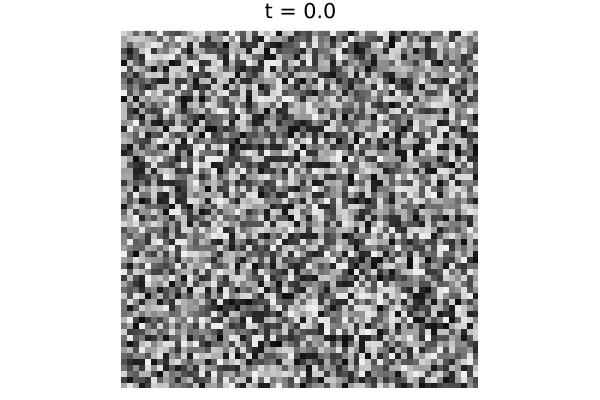

In [1]:
using Symbolics
using LinearAlgebra, SparseArrays 
using DifferentialEquations, ModelingToolkit, SparseDiffTools, Sundials
using Plots

# Generate the constants
N = 60
dx = 0.1
Ax = Array(Tridiagonal([1.0 for i in 1:N-1],[-2.0 for i in 1:N],[1.0 for i in 1:N-1]))
Ay = copy(Ax)
Ax[2,1] = 2.0
Ax[end-1,end] = 2.0
Ay[1,2] = 2.0
Ay[end,end-1] = 2.0

#Parameters
f = 1.2
m = 190
q = 0.001
ϵ₁ = 0.01
ϵ = 0.01
K = 1000
Θ = 0.044
d₀ = 0.01
D₁ = 1
p = [f, m, q, ϵ, ϵ₁, D₁, d₀, K, Θ, dx]

function basic_version!(du,u,p,t)
  f, m, q, ϵ, ϵ₁, D₁, d₀, K, Θ, dx = p
  D₂ = D₁/d₀*(1 + (K-1)/(1+3/Θ))^(-3/2)
  c₁ = @view u[:,:,1]
  c₂ = @view u[:,:,2]
  dc₁ = @view du[:,:,1]
  dc₂ = @view du[:,:,2]
  
  Δ₁ = (1/dx^2)*D₁*(Ay*c₁ + c₁*Ax)
  Δ₂ = (1/dx^2)*D₂*(Ay*c₂ + c₂*Ax)
  @. dc₁ = Δ₁ .+ 1/ϵ*(f*c₂.*(q .- c₁)./(q .+ c₁) .+ c₁ .* (1 .- m*c₂)./(1 .- m*c₂ .+ ϵ₁) .- c₁.^2)
  @. dc₂ = Δ₂ .+ c₁ .* (1 .- m*c₂)./(1 .- m*c₂ .+ ϵ₁) .- c₂
end

tspan = (0.0,0.1)
u0 = rand(Float64, (N,N,2))

# Jacobian Approach
du0 = similar(u0)
#sparsity_pattern = Symbolics.jacobian_sparsity(basic_version!,du0,u0,p,0.0)
#jac_sparsity = Float64.(sparse(sparsity_pattern))
#colorvec = matrix_colors(jac_sparsity)
#@show maximum(colorvec)
#f = ODEFunction(basic_version!;jac_prototype=jac_sparsity,colorvec=colorvec)
f = ODEFunction(basic_version!)
prob = ODEProblem(f,u0,tspan,p)
## Solve!
println("Solving")
@time sol = solve(prob,Tsit5(), saveat=range(0, stop=tspan[2], length=101)) 

anim = @animate for i in 1:length(sol.t)
  tit = "t = $(sol.t[i])" 
  heatmap(sol.u[i][:,:,1], c=:grays, title=tit, aspect_ratio=:equal, axis=([], false), colorbar=false)
end

gif(anim, fps=5)

Solving


┌ Info: Saved animation to 
│   fn = /Users/djplahaye/mysoftware/my_jupyter_notebooks/my_julia_notebooks/turing_patterns/tmp.gif
└ @ Plots /Users/djplahaye/.julia/packages/Plots/YAlrZ/src/animation.jl:114


Plots.AnimatedGif("/Users/djplahaye/mysoftware/my_jupyter_notebooks/my_julia_notebooks/turing_patterns/tmp.gif")
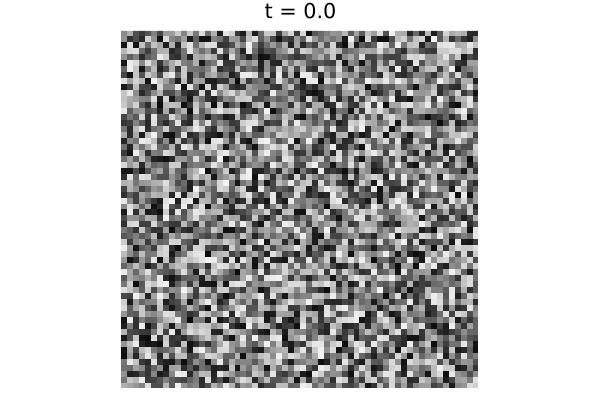

In [14]:
using DifferentialEquations, LinearAlgebra, SparseArrays, Symbolics

using ModelingToolkit, SparseDiffTools, AlgebraicMultigrid

# Numerics
N = 60
dx = 0.25
x = range(0, stop=30.0, step=dx)
Ax = Array(Tridiagonal([1.0 for i in 1:N-1],[-2.0 for i in 1:N],[1.0 for i in 1:N-1]))
Ay = copy(Ax)
Ax[2,1] = 2.0
Ax[end-1,end] = 2.0
Ay[1,2] = 2.0
Ay[end,end-1] = 2.0

# Parameters
f = 1.2
m = 190
q = 0.001
ϵ₁ = 0.01
ϵ = 0.01
K = 1000
Θ = 0.002
d₀ = 0.01
D₁ = 1
p = [f, m, q, ϵ, ϵ₁, D₁, d₀, K, Θ, dx]

function basic_version!(du,u,p,t)
  f, m, q, ϵ, ϵ₁, D₁, d₀, K, Θ, dx = p
  D₁ = D₁/dx^2
  D₂ = D₁/d₀*(1 + (K-1)/(1+3/Θ))^(-3/2)

  @inbounds for j in 2:N-1, i in 2:N-1
    du[i,j,1] = D₁*(u[i-1,j,1] + u[i+1,j,1] + u[i,j+1,1] + u[i,j-1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)

  end

  @inbounds for j in 2:N-1, i in 2:N-1
    du[i,j,2] = D₂*(u[i-1,j,2] + u[i+1,j,2] + u[i,j+1,2] + u[i,j-1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 
  end

  @inbounds for j in 2:N-1
    i = 1
    du[1,j,1] = D₁*(2u[i+1,j,1] + u[i,j+1,1] + u[i,j-1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
  end
  @inbounds for j in 2:N-1
    i = 1
    du[1,j,2] = D₂*(2u[i+1,j,2] + u[i,j+1,2] + u[i,j-1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 
  end
  @inbounds for j in 2:N-1
    i = N
    du[end,j,1] = D₁*(2u[i-1,j,1] + u[i,j+1,1] + u[i,j-1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
  end
  @inbounds for j in 2:N-1
    i = N
    du[end,j,2] = D₂*(2u[i-1,j,2] + u[i,j+1,2] + u[i,j-1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 
  end

  @inbounds for i in 2:N-1
    j = 1
    du[i,1,1] = D₁*(u[i-1,j,1] + u[i+1,j,1] + 2u[i,j+1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
  end
  @inbounds for i in 2:N-1
    j = 1
    du[i,1,2] = D₂*(u[i-1,j,2] + u[i+1,j,2] + 2u[i,j+1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 
  end
  @inbounds for i in 2:N-1
    j = N
    du[i,end,1] = D₁*(u[i-1,j,1] + u[i+1,j,1] + 2u[i,j-1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
  end
  @inbounds for i in 2:N-1
    j = N
    du[i,end,2] = D₂*(u[i-1,j,2] + u[i+1,j,2] + 2u[i,j-1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 
  end

  @inbounds begin
    i = 1; j = 1
    du[1,1,1] = D₁*(2u[i+1,j,1] + 2u[i,j+1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
    du[1,1,2] = D₂*(2u[i+1,j,2] + 2u[i,j+1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 

    i = 1; j = N
    du[1,N,1] = D₁*(2u[i+1,j,1] + 2u[i,j-1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
    du[1,N,2] = D₂*(2u[i+1,j,2] + 2u[i,j-1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 

    i = N; j = 1
    du[N,1,1] = D₁*(2u[i-1,j,1] + 2u[i,j+1,1] - 4u[i,j,1]) +
                1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
    du[N,1,2] = D₂*(2u[i-1,j,2] + 2u[i,j+1,2] - 4u[i,j,2]) +
                u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 

    i = N; j = N
    du[end,end,1] = D₁*(2u[i-1,j,1] + 2u[i,j-1,1] - 4u[i,j,1]) +
                    1/ϵ*(f*u[i,j,2]*(q - u[i,j,1])/(q + u[i,j,1]) + u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,1]^2)
    du[end,end,2] = D₂*(2u[i-1,j,2] + 2u[i,j-1,2] - 4u[i,j,2]) +
                    u[i,j,1] * (1-m*u[i,j,2])/(1-m*u[i,j,2]+ϵ₁) - u[i,j,2] 
   end
end

tspan = (0.0,5.0)
u0 = 1e-3*rand(Float64, (N,N,2))

# Jacobian Approach
du0 = similar(u0)
#sparsity_pattern = Symbolics.jacobian_sparsity(basic_version!,du0,u0,p,0.0)
#jac_sparsity = Float64.(sparse(sparsity_pattern))
#colorvec = matrix_colors(jac_sparsity)
#@show maximum(colorvec)
# f = ODEFunction(basic_version!;jac_prototype=jac_sparsity,colorvec=colorvec)
f = ODEFunction(basic_version!)
prob = ODEProblem(f,u0,tspan,p)

#function algebraicmultigrid(W,du,u,p,t,newW,Plprev,Prprev,solverdata)
#  if newW === nothing || newW
#    Pl = aspreconditioner(ruge_stuben(convert(AbstractMatrix,W)))
#  else
#    Pl = Plprev
#  end
#  Pl,nothing
#end

Base.eltype(::AlgebraicMultigrid.Preconditioner) = Float64

# Solve!
println("Solving")
#@time sol = solve(prob,KenCarp47(linsolve=KrylovJL_GMRES(),precs=algebraicmultigrid,concrete_jac=true), saveat=range(0, stop=tspan[2], length=101), abstol=1e-8, reltol=1e-8)
sol = solve(prob,abstol=1e-8, reltol=1e-8)

anim = @animate for i in 1:length(sol.t)
  tit = "t = $(sol.t[i])" 
  heatmap(sol.u[i][:,:,1], c=:grays, title=tit, aspect_ratio=:equal, axis=([], false), colorbar=false)
end

gif(anim, fps=5)